<a href="https://colab.research.google.com/github/Raihan4520/Stable-Diffusion/blob/main/Text2Image_Image2Text_StableDiffusion.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Text-to-Image Generation using **Stable Diffusion**

In [1]:
# Check GPU
!nvidia-smi


Thu Oct  3 16:15:46 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   75C    P8              11W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
# Install necessary libraries
!pip install -q diffusers transformers torch accelerate pillow datasets huggingface_hub torchvision


In [3]:
# Import necessary libraries
import os
import torch
import requests
from PIL import Image
from IPython.display import display
from diffusers import StableDiffusionPipeline
from transformers import BlipProcessor, BlipForConditionalGeneration


In [4]:
# Check all models from Hugging Face: https://huggingface.co/models?pipeline_tag=text-to-image&sort=downloads

# Load the pre-trained Stable Diffusion model from Hugging Face
t2i_model_id1 = "sd-legacy/stable-diffusion-v1-5"
t2i_model_id2 = "CompVis/stable-diffusion-v1-4"
pipe = StableDiffusionPipeline.from_pretrained(t2i_model_id2, torch_dtype=torch.float16)

# Enable GPU
pipe.to("cuda")


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


StableDiffusionPipeline {
  "_class_name": "StableDiffusionPipeline",
  "_diffusers_version": "0.30.3",
  "_name_or_path": "CompVis/stable-diffusion-v1-4",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": true,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "PNDMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [6]:
# Check all parameters for functions: https://huggingface.co/docs/diffusers/en/api/pipelines/stable_diffusion/text2img#diffusers.StableDiffusionPipeline.__call__.prompt

# Function to generate an image from text and save it.
def generate_image(prompt, image_path, height=512, width=512, num_inference_steps=50, guidance_scale=7.5, eta=0.0):
    """
    Generates an image using Stable Diffusion with custom parameters.

    Args:
    - prompt (str): The text prompt describing the image.
    - image_path (str): The file path to save the generated image.
    - height (int): Height of the output image.
    - width (int): Width of the output image.
    - num_inference_steps (int): The number of denoising steps.
    - guidance_scale (float): A higher value encourages the model to follow the text more closely.
    - eta (float): Controls the randomness in the denoising process.

    Returns:
    - image: The generated image.
    """
    # Generate the image with custom parameters
    image = pipe(
        prompt,
        height=height,
        width=width,
        num_inference_steps=num_inference_steps,
        guidance_scale=guidance_scale,
        eta=eta
    ).images[0]

    # Save the image to the specified path
    image.save(image_path)
    return image

# Function to generate multiple images from a list of prompts with custom parameters
def generate_images(prompts, save_folder, height=512, width=512, num_inference_steps=50, guidance_scale=7.5, eta=0.0):
    """
    Generates multiple images based on a list of text prompts and custom parameters.

    Args:
    - prompts (list of str): A list of text prompts.
    - save_folder (str): The folder where the images will be saved.
    - height (int): Height of the output images.
    - width (int): Width of the output images.
    - num_inference_steps (int): The number of denoising steps.
    - guidance_scale (float): A higher value encourages the model to follow the text more closely.
    - eta (float): Controls the randomness in the denoising process.

    Returns:
    - images (list of Image): A list of generated images.
    """
    images = []

    # Check if the save_folder exists, create it if not
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)
        print(f"Created folder: {save_folder}")

    # Iterate over the prompts and generate images
    for i, prompt in enumerate(prompts):
        image_path = os.path.join(save_folder, f"generated_image_{i+1}.png")
        try:
            image = generate_image(prompt, image_path, height=height, width=width, num_inference_steps=num_inference_steps, guidance_scale=guidance_scale, eta=eta)
            images.append(image)
            print(f"Generated image {i+1} for prompt: '{prompt}' and saved at {image_path}")
        except Exception as e:
            print(f"Error generating image for prompt '{prompt}': {str(e)}")

    return images


  0%|          | 0/200 [00:00<?, ?it/s]

Generated image 1 for prompt: 'A group of astronauts having a barbecue on the moon with a view of Earth in the background' and saved at generated_images/generated_image_1.png


  0%|          | 0/200 [00:00<?, ?it/s]

Generated image 2 for prompt: 'A magical library with floating books and enchanted candles, and a wise owl wearing glasses' and saved at generated_images/generated_image_2.png


  0%|          | 0/200 [00:00<?, ?it/s]

Generated image 3 for prompt: 'A futuristic city where robots and humans live in harmony, with flying cars in the background.' and saved at generated_images/generated_image_3.png


  0%|          | 0/200 [00:00<?, ?it/s]

Generated image 4 for prompt: '' and saved at generated_images/generated_image_4.png
Displaying image 1


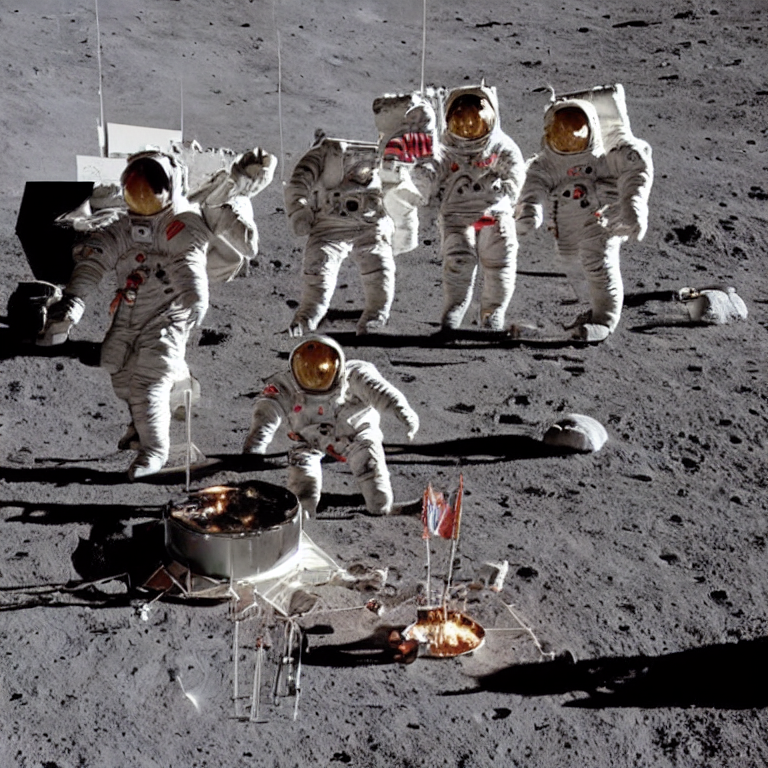

Displaying image 2


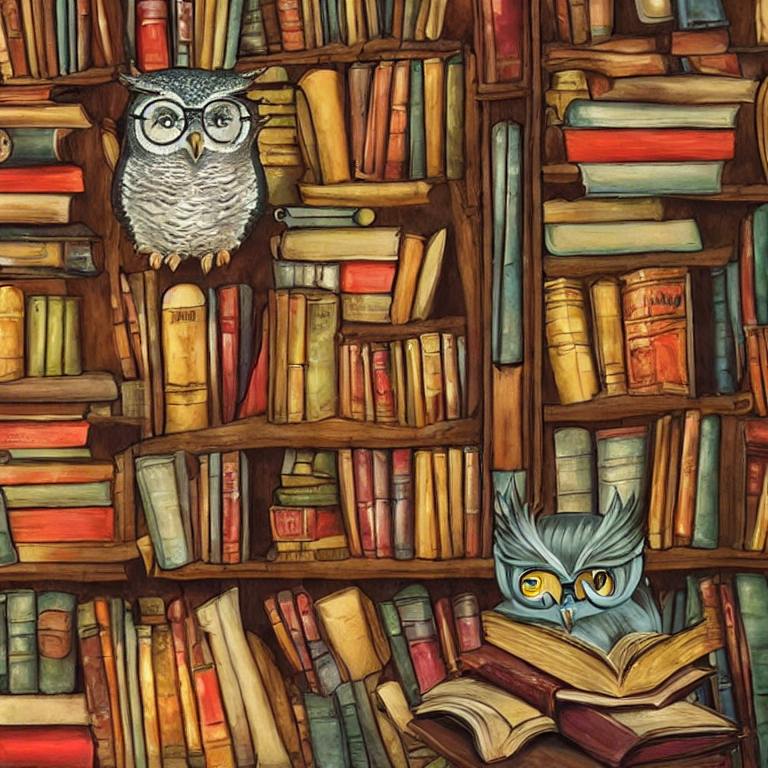

Displaying image 3


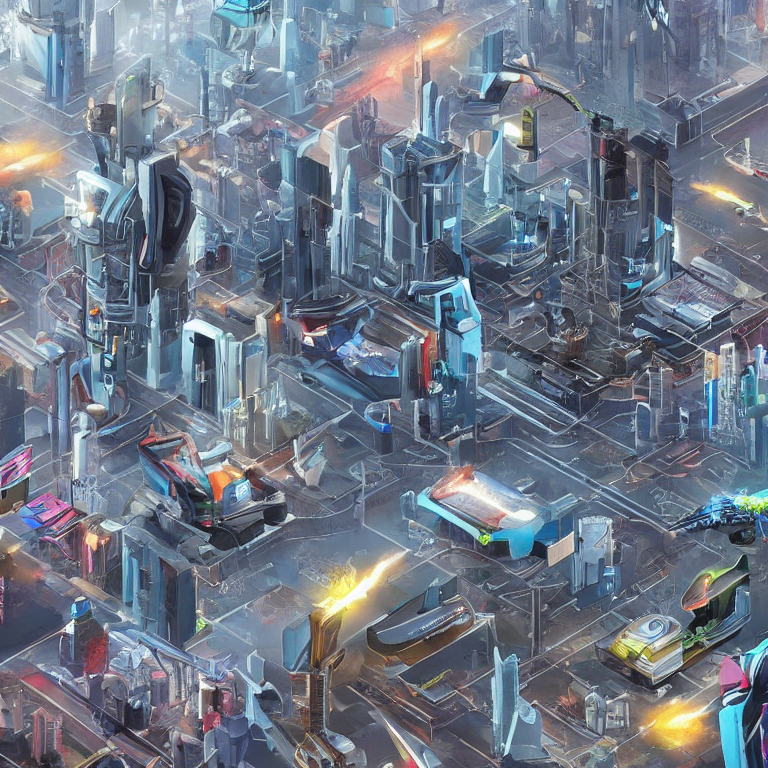

Displaying image 4


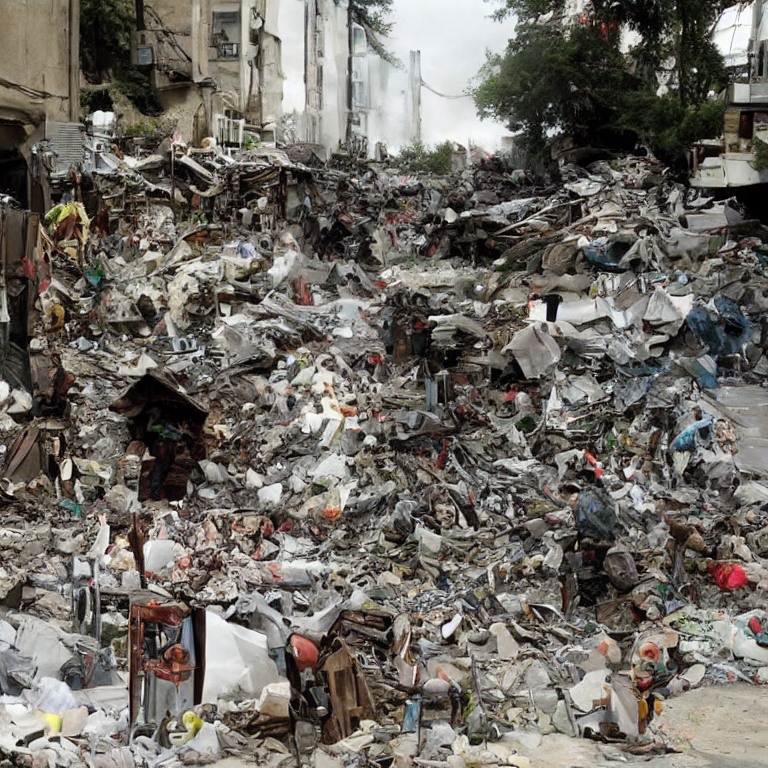

In [7]:
# Generate multiple images from a list of prompts
prompts = [
    "A group of astronauts having a barbecue on the moon with a view of Earth in the background",
    "A magical library with floating books and enchanted candles, and a wise owl wearing glasses",
    "A futuristic city where robots and humans live in harmony, with flying cars in the background.",
    "" # Generate image without any prompt (It works!)
]

# Create a folder for saving the images
save_folder = "generated_images"
os.makedirs(save_folder, exist_ok=True)

# Generate and save the images
images = generate_images(prompts, save_folder, height=768, width=768, num_inference_steps=200, guidance_scale=8.0, eta=0.5)

# Display the generated images
for i, img in enumerate(images):
    print(f"Displaying image {i+1}")
    display(img)


# Image-to-Text Generation using **Stable Diffusion**

In [8]:
# Check all models from Hugging Face: https://huggingface.co/models?pipeline_tag=image-to-text&sort=downloads

# Load the processor and model from Hugging Face
i2t_model_id1 = "microsoft/trocr-base-handwritten"
i2t_model_id2 = "Salesforce/blip-image-captioning-base"
processor = BlipProcessor.from_pretrained(i2t_model_id2)
model = BlipForConditionalGeneration.from_pretrained(i2t_model_id2)


In [9]:
# Function to generate a caption from an image
def generate_image_caption(image_path):
    """
    Generates a caption for an image

    Args:
    - image_path (str): Path to the image to caption.

    Returns:
    - str: Generated caption describing the image.
    """
    # Open the image
    image = Image.open(image_path)

    # Display the image
    display(image)

    # Preprocess the image
    inputs = processor(image, return_tensors="pt")

    # Generate a caption
    out = model.generate(**inputs)
    caption = processor.decode(out[0], skip_special_tokens=True)

    return caption


Image 1:


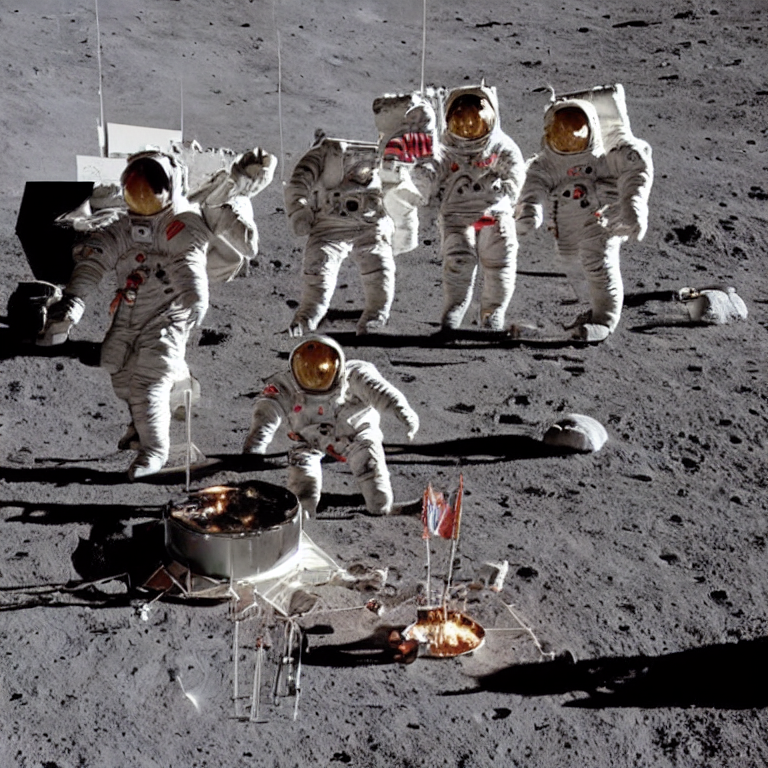

/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Generated caption: astronauts on the moon

Image 2:


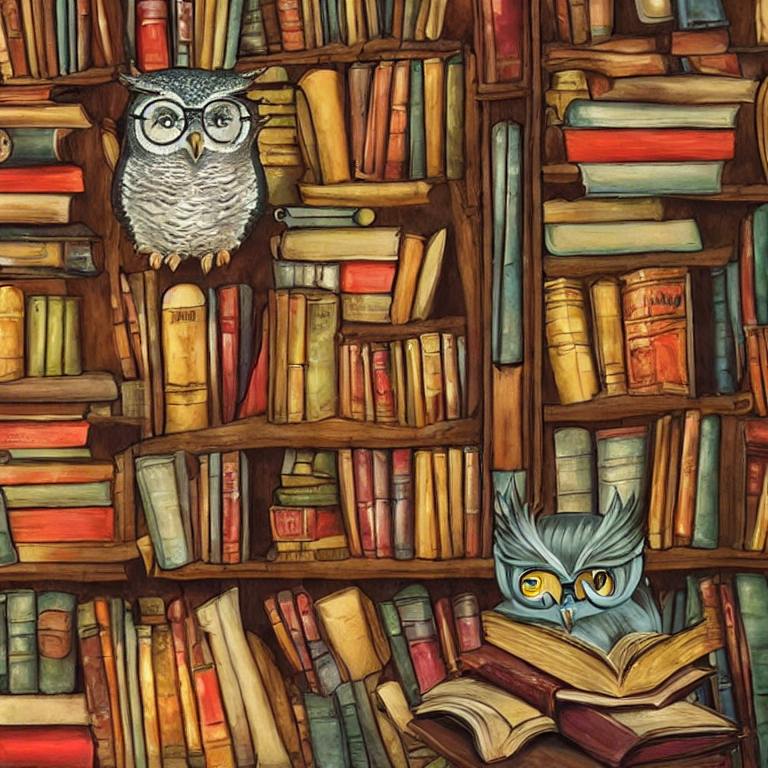

Generated caption: owl and books canvas art print

Image 3:


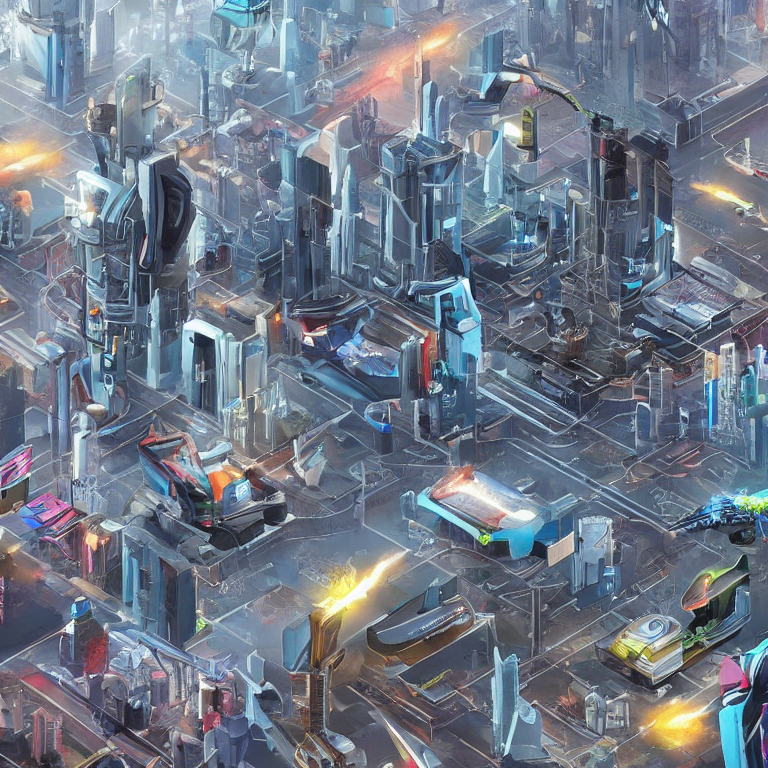

Generated caption: futuristic cityscar by alex - on devi

Image 4:


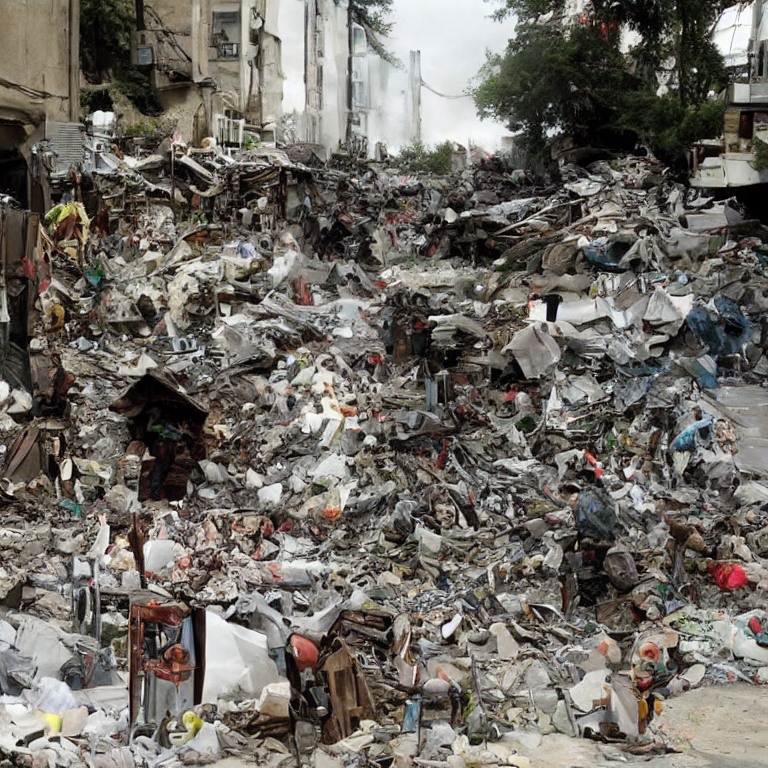

Generated caption: a pile of garbage in the middle of a street



In [10]:
# Generate captions for each image
for i in range(len(images)):
    image_path = f"{save_folder}/generated_image_{i+1}.png"
    print(f"Image {i+1}:")

    # Generate and print caption for the image
    caption = generate_image_caption(image_path)
    print(f"Generated caption: {caption}\n")
